In [1]:
dataDir = "E:/Datasets/PSI_2_dataset"
annotationDir = f"{dataDir}/PSI2.0_TrainVal/annotations"
cvAnnotationDir = f"{annotationDir}/cv_annotation"
databaseDir = f"{dataDir}/database"

In [2]:
exec(open('init_notebook.py').read())

current working dirF:\PSI-Dataset


In [3]:
%load_ext autoreload
%autoreload 2

In [92]:
import pandas as pd
import os
# import seaborn as sns
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import numpy.typing as npt
import json
import pickle
from typing import *
from collections import defaultdict
from sortedcontainers import SortedDict
from functools import lru_cache

In [4]:
videoName = "video_0004"
# frameFolder = os.path.join(dataDir, "frames", videoName)
# annotationFile = os.path.join(cvAnnotationDir, videoName, "cv_annotation.json")
# os.listdir(frameFolder)

In [93]:
BBox = Tuple[float, float, float, float]
Decision = Tuple[str, str, BBox]
FrameNo = int

@lru_cache(maxsize=50)
def loadVideoFrames(videoName):
    # Load the frames
    frameFolder = os.path.join(dataDir, "frames", videoName)
    frames = []
    for imName in tqdm(sorted(os.listdir(frameFolder))): # sorting is necessary
    #     print(imName)
        imPath = os.path.join(frameFolder, imName)
        frames.append(cv2.imread(imPath))
    
    return frames

@lru_cache(maxsize=50)
def loadCVAnnotation(videoName):
    annotationFile = os.path.join(cvAnnotationDir, videoName, "cv_annotation.json")
    with open(annotationFile, 'r') as file:
        annotation = json.load(file)
        return annotation

def showFrame(title: str, img: npt.ArrayLike):
    cv2.imshow(title, img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    cv2.waitKey(1)
    
def showFrameInline(img: npt.ArrayLike, bbox = None):
    plt.figure(figsize=(15,10))
    if bbox is not None:
        img = img.copy()
        tL = (int(bbox[0]), int(bbox[1]))
        bR = (int(bbox[2]), int(bbox[3]))
#         tL =(300,115)
#         bR =(475,225)
        cv2.rectangle(
            img, tL, bR,
            (0, 0, 255),
            thickness = 3, 
            lineType=cv2.LINE_8
        )
        
    plt.imshow(img[:,:,::-1])
    plt.show()
    
def printStructure(dic: Dict[any, any], indent=0):
    for key, val in dic.items():
        print(" " * indent, "-", key, type(val).__name__, len(val))
        if isinstance(val, dict):
            printStructure(val, indent+2)
    

In [81]:
def getFirstPedKey(pickledVideoDb, videoName) -> str:
    for pedKey in pickledVideoDb[videoName]:
        return pedKey

def getAllPedKeys(pickledVideoDb, videoName) -> List[str]:
    return [pedKey for pedKey in pickledVideoDb[videoName]]

def findVideoDecisions(pedFrames, nlpAnnotations, cvAnnotations) -> Dict[FrameNo, List[Decision]]:
    """ returns the annotations by different annotators for each key frame.
    """
    assert len(pedFrames) == len(cvAnnotations["bbox"]) # they have 1-to-1 mapping
    
    decisions = SortedDict()
    for annotator in nlpAnnotations:
        userAnnotations = nlpAnnotations[annotator]
        
        assert len(pedFrames) == len(userAnnotations["key_frame"]) # they have 1-to-1 mapping
        assert len(pedFrames) == len(userAnnotations["intent"]) # they have 1-to-1 mapping
        assert len(pedFrames) == len(userAnnotations["description"]) # they have 1-to-1 mapping
        
        for frameIdx, isKey in enumerate(userAnnotations["key_frame"]):
            if isKey == 1:
                frameNo = pedFrames[frameIdx]
                if frameNo not in decisions:
                    decisions[frameNo] = []
                decisions[frameNo].append(
                    (
                        userAnnotations['intent'][frameIdx], 
                        userAnnotations['description'][frameIdx], 
                        cvAnnotations['bbox'][frameIdx]
                    )
                )
    return decisions

def printDecisions(frameImgs, decisions):
    for frameIdx in decisions:
        print(f"frame {frameIdx}")
        bbox = decisions[frameIdx][0][2]
        showFrameInline(frameImgs[frameIdx], bbox)
        for userAnnotation in decisions[frameIdx]:
            print(userAnnotation)


In [95]:
# Load the frames
frames = loadVideoFrames(videoName)

In [ ]:
showFrame("Frame 0", frames[55])

# Annotations

## Base CV Annotations

In [7]:
videoName = "video_0004"
pedTrackKey = "pedestrian_track_22"
frameKey = 'frame_155'
annotation = loadCVAnnotation(videoName)
print(annotation.keys())

dict_keys(['video_name', 'frames'])


In [8]:
# print(annotation["frames"].keys())
# print(annotation["frames"][frameKey].keys())
# print(annotation["frames"][frameKey]["cv_annotation"].keys())
# print(annotation["frames"][frameKey]["cv_annotation"][pedTrackKey].keys())

In [13]:
observedFrames = annotation["frames"][frameKey]["cv_annotation"][pedTrackKey]["observed_frames"]
print(observedFrames[0], observedFrames[-1])

155 252


## Annotations for Prediction Task

In [14]:
trainDbPath = os.path.join(databaseDir, "traj_database_train.pkl")
with open(trainDbPath, "rb") as f:
    trainDb = pickle.load(f)

In [69]:
# printStructure(trainDb)

In [85]:
videoName = "video_0007"
dbPedKey = getPedKey(trainDb, videoName)
print(trainDb.keys())
# print(type(trainDb[videoName]))
print(trainDb[videoName].keys())
# print(trainDb[videoName][dbPedKey].keys())
# print(trainDb[videoName][dbPedKey]['cv_annotations'].keys())
# print(trainDb[videoName][dbPedKey]['nlp_annotations'].keys())

dict_keys(['video_0001', 'video_0002', 'video_0003', 'video_0004', 'video_0005', 'video_0006', 'video_0007', 'video_0008', 'video_0009', 'video_0010', 'video_0011', 'video_0012', 'video_0013', 'video_0014', 'video_0015', 'video_0016', 'video_0017', 'video_0018', 'video_0019', 'video_0020', 'video_0021', 'video_0022', 'video_0023', 'video_0024', 'video_0025', 'video_0026', 'video_0027', 'video_0028', 'video_0029', 'video_0030', 'video_0031', 'video_0032', 'video_0033', 'video_0034', 'video_0035', 'video_0036', 'video_0037', 'video_0038', 'video_0039', 'video_0040', 'video_0041', 'video_0042', 'video_0043', 'video_0044', 'video_0045', 'video_0046', 'video_0047', 'video_0048', 'video_0049', 'video_0050', 'video_0051', 'video_0052', 'video_0053', 'video_0054', 'video_0055', 'video_0056', 'video_0057', 'video_0058', 'video_0059', 'video_0060', 'video_0061', 'video_0062', 'video_0063', 'video_0065', 'video_0066', 'video_0067', 'video_0068', 'video_0069', 'video_0071', 'video_0073', 'video_00

In [16]:
assert trainDb[videoName][dbPedKey]["frames"] == observedFrames
assert len(trainDb[videoName][dbPedKey]['cv_annotations']["bbox"]) == len(observedFrames)

In [188]:
# user1Annotations = trainDb[videoName][dbPedKey]['nlp_annotations']['nlp_vid_4_uid_5115_v2']
# assert len(user1Annotations['intent']) == len(observedFrames)
# assert len(user1Annotations['description']) == len(observedFrames)
# assert len(user1Annotations['key_frame']) == len(observedFrames)
# print(user1Annotations.keys())

In [154]:
# user1Annotations['key_frame']

In [30]:
# trainDb[videoName][dbPedKey]['frames'] # frame sequence of the ped trajectory

## Key decision frames extraction 

In [99]:
videosToAnalyze = ['video_0002', 'video_0004', 'video_0006']
# videosToAnalyze = trainDb.keys()
## load video frames once
framesDic = {}
for videoName in videosToAnalyze:
    if videoName not in framesDic:
        framesDic[videoName] = loadVideoFrames(videoName)

100%|███████████████████████████████████████████████████████████████████████████████| 451/451 [00:04<00:00, 105.95it/s]


Pedestrian track_0
frame 57


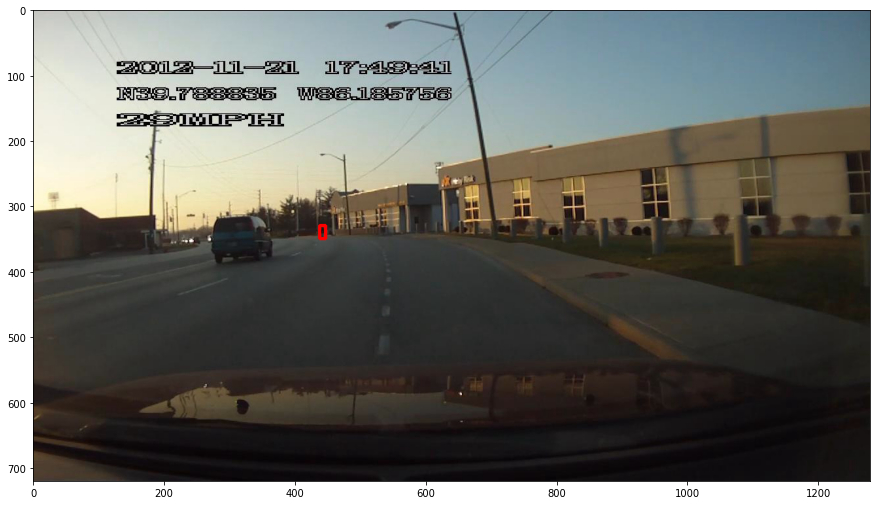

('cross', 'They are a young male. They are walking. they are in a right turn lane. They are in the middle of the road.  they are 15 meters from the car. ', [438.82, 329.66, 447.75, 349.6])
frame 92


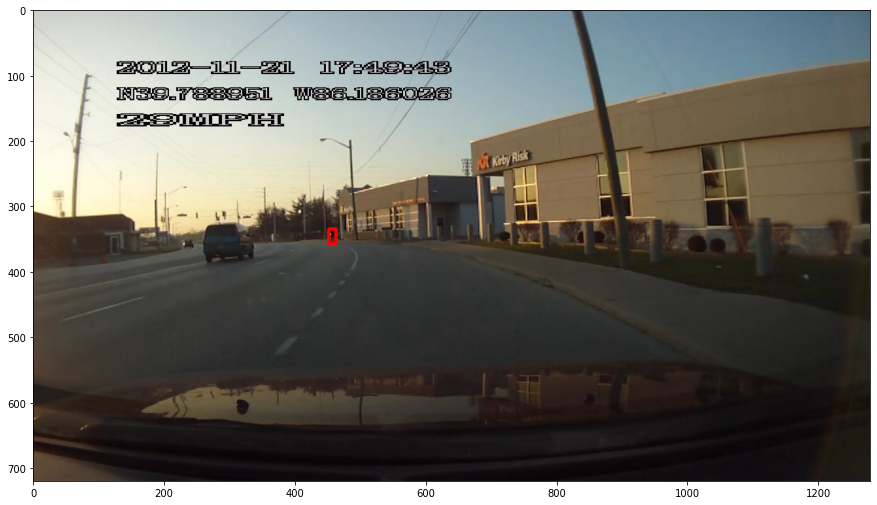

('cross', 'The pedestrian is crossing the road. There is a traffic light ahead. They are walking to the right from the left side of the road. The pedestrian is walking in front of the car. They are to the left. They are crossing right. ', [452.93, 334.58, 463.38, 357.22])
frame 99


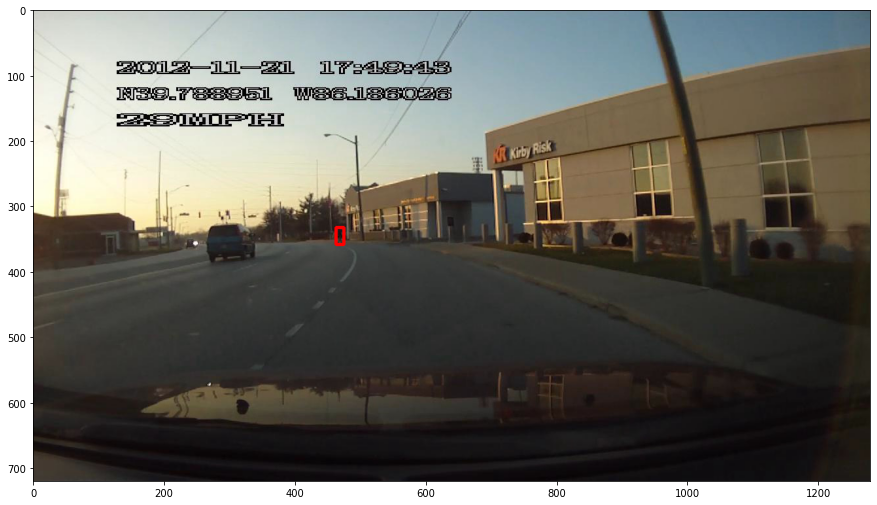

('cross', 'They are walking. They are not looking.   They are walking to the right. They are on the road.  They are 200 feet away. They are on the left.  ', [463.34, 332.98, 475.06, 358.34])
frame 101


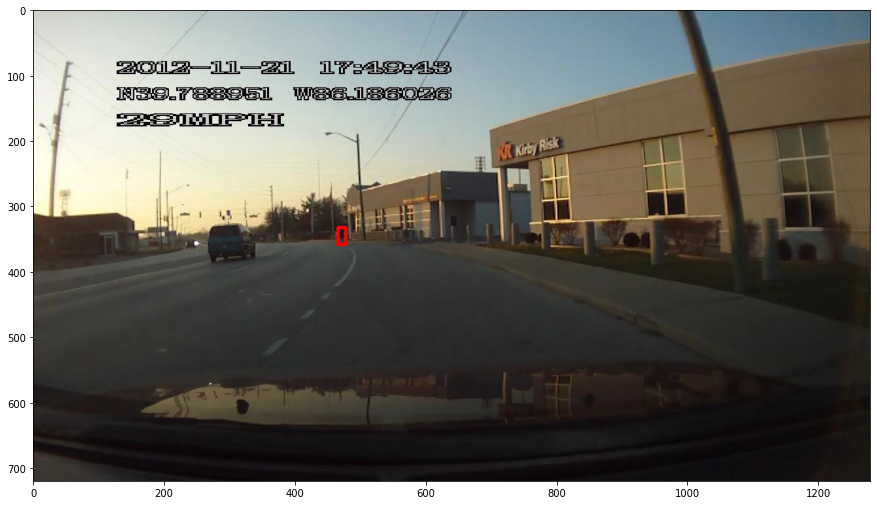

('cross', 'A person is crossing the road. They are walking toward the sidewalk.  They are old. The sun is setting. They are walking toward the sidewalk. They are in our lane of traffic. They are on the the right side of the road. They are far from our car. They are in front of our car.   ', [466.22, 332.36, 478.26, 358.31])
frame 114


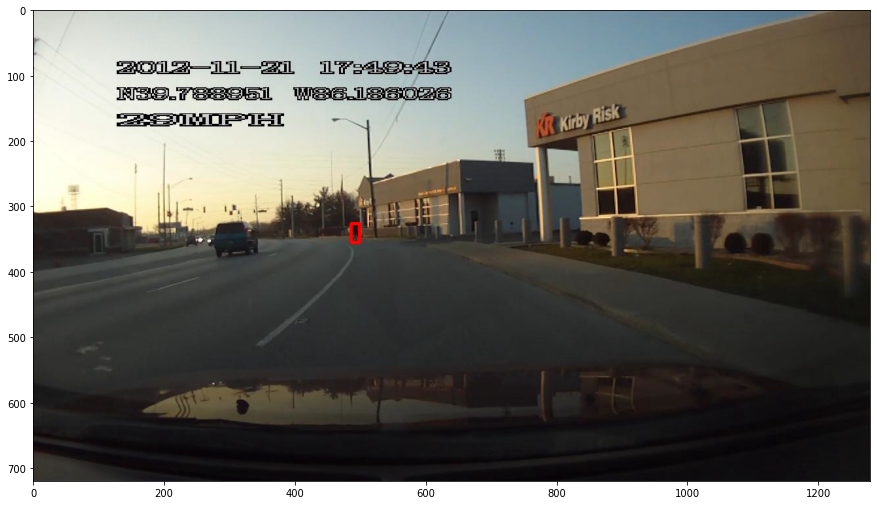

('cross', 'The pedestrian is halfway through the lane right in front of the car.    ', [486.19, 326.21, 499.38, 355.08])
frame 118


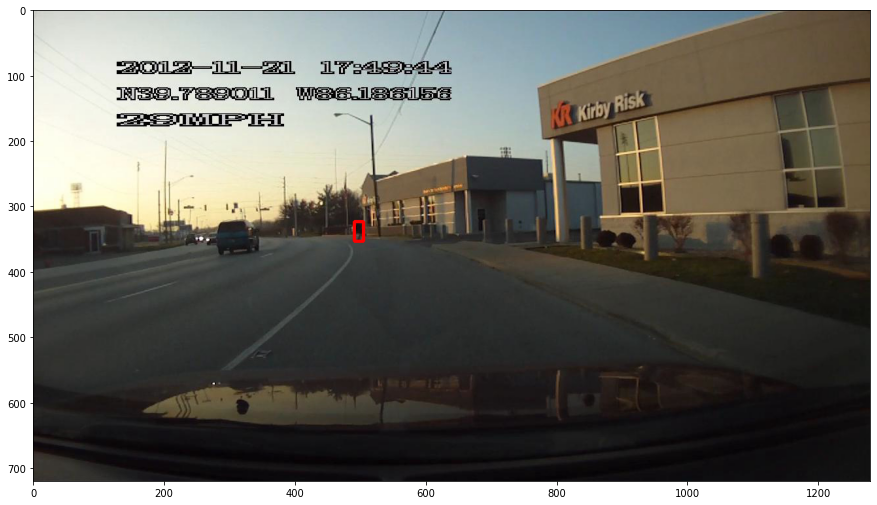

('cross', 'Man is walking quickly.  Man is walking in road. Man is walking in front of car on left. Man is in the driving lane and will continue to cross.', [491.58, 323.65, 505.46, 353.56])
frame 121


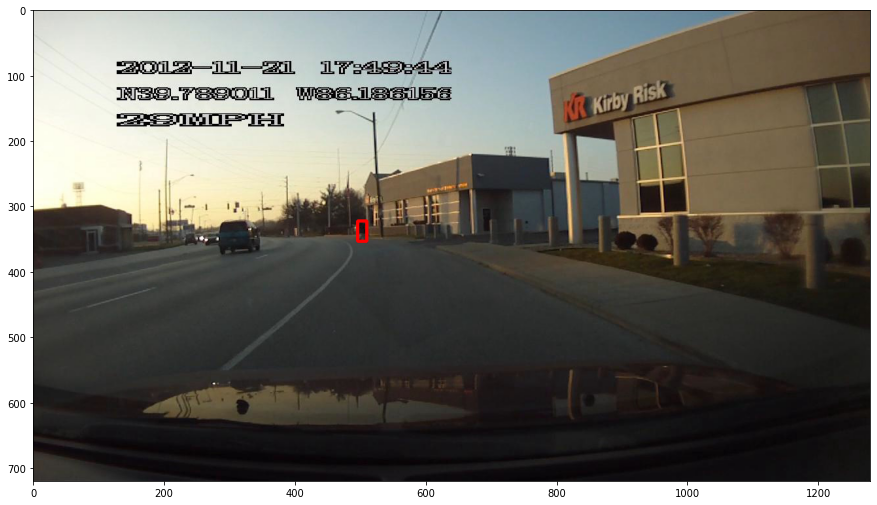

('cross', 'They are walking. They are not looking.  There is no crosswalk.  They are on the road. They are crossing to the right. They are in the middle of the road.  They are 200 feet away. They are far away.  Since they are crossing and this car is far away, they will finish crossing. ', [496.47, 322.41, 510.16, 353.4])
frame 126


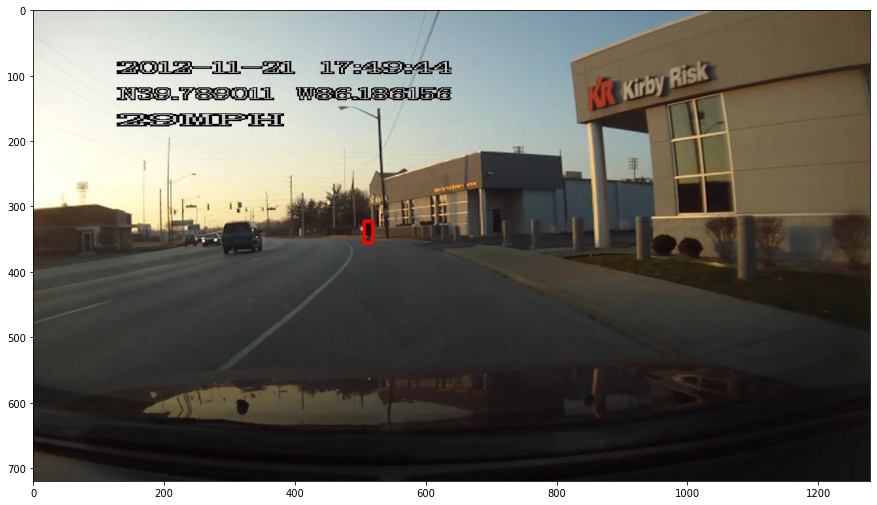

('cross', 'The pedestrian is actively crossing in front of the car. They are walking at an average speed.   They are in the middle of the road. They are walking into the road.  The car is maintaining speed. They are closer to the car now than before. The other car is passing them.  ', [506.6, 322.62, 519.38, 356.4])
('cross', 'This person quickly moves out of the way.  This person is on the right-most lane of the road. They are walking to the sidewalk nearest them. This car is moving quickly. The person is a fair distance from this car. ', [506.6, 322.62, 519.38, 356.4])
frame 128


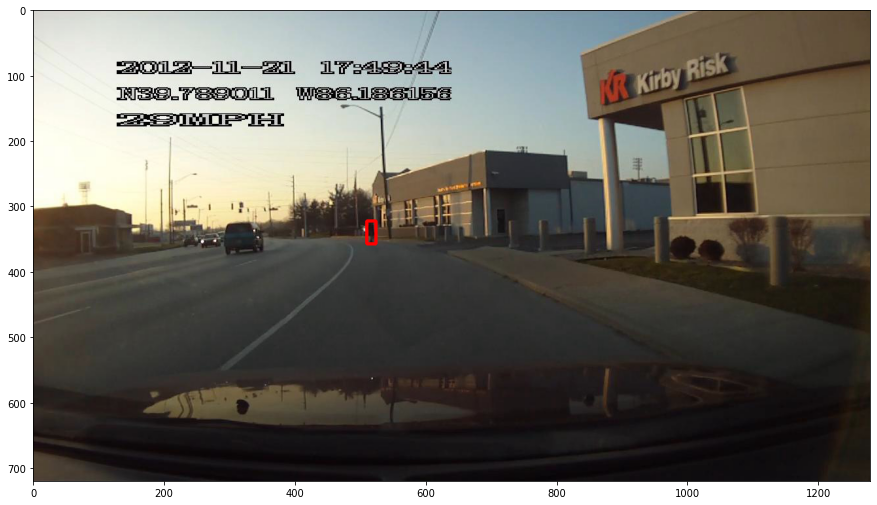

('cross', 'The pedestrian is walking quickly toward the sidewalk to the right of the car. They have crossed the street.  They are moving out of the road. They are moving to the sidewalk.  ', [510.95, 322.7, 524.53, 357.6])
frame 131


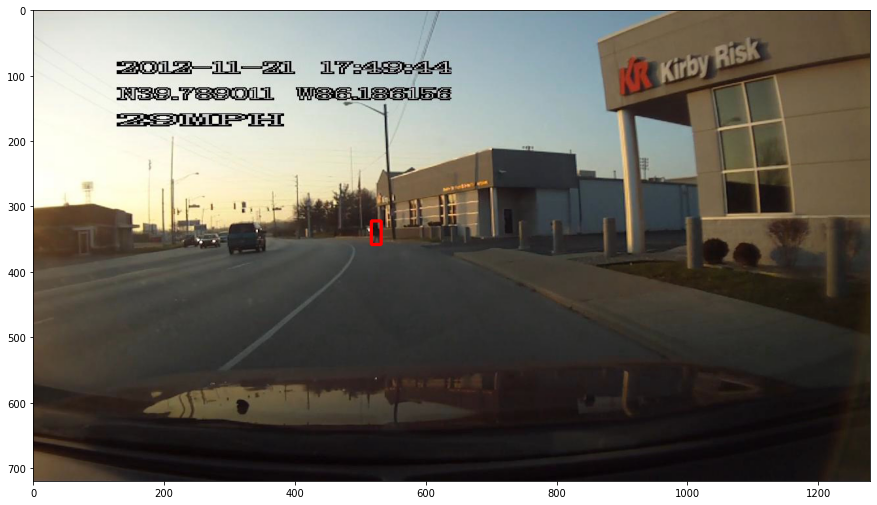

('not_cross', 'The person is almost at the sidewalk.  The person is still about 50+ feet in front of the car. The car is maintaining 29 miles per hour. ', [517.56, 322.28, 532.57, 358.65])
frame 155


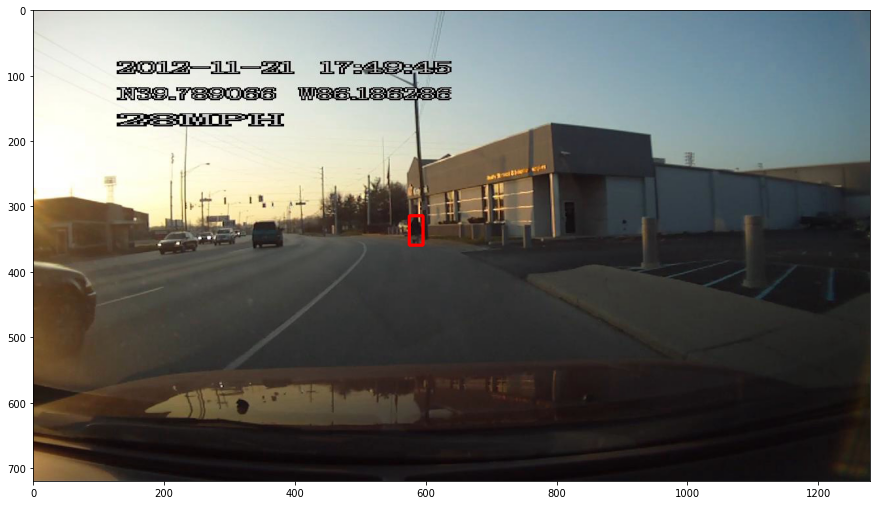

('not_cross', 'Pedestrian is walking. They are moving briskly.   They are in the road. They are walking out of the road. They are moderately ahead of the car. Other cars are moving quickly. ', [575.86, 314.57, 596.45, 359.65])
frame 175


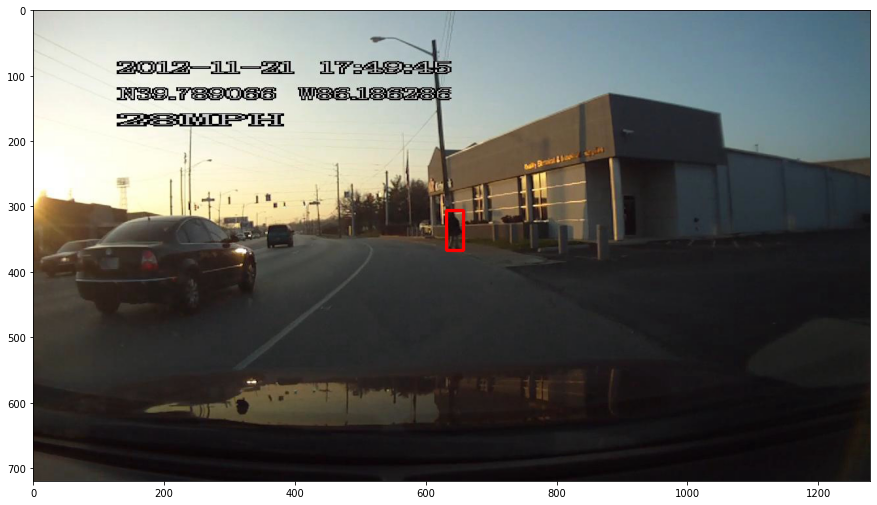

('not_cross', 'The pedestrian is walking on the sidewalk. He is walking away from the car. He is no longer in the road.   He is on the right side of the road on the sidewalk. He is walking away from the road.  He is close to the car. The car is maintaining speed. He is on the left side of the car. The other car is close to him too. They are maintaining speed.  ', [632.2, 306.37, 658.6, 367.55])
frame 186


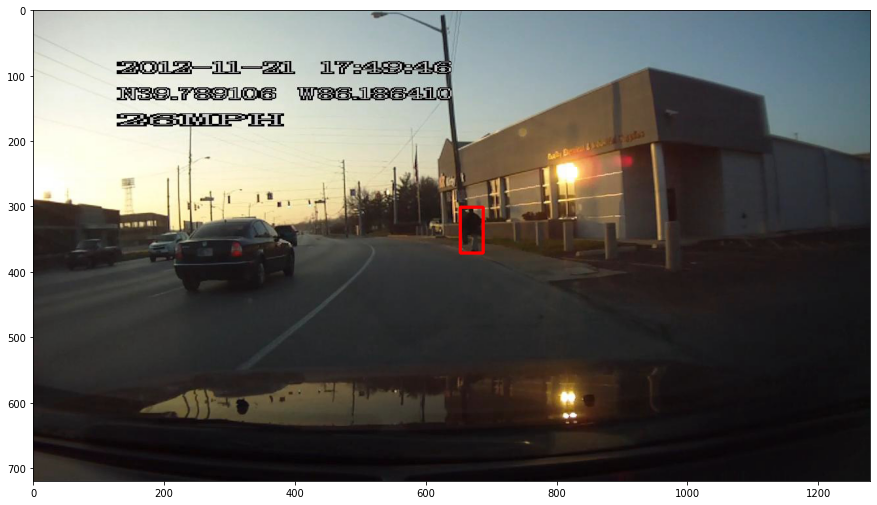

('not_cross', 'Man is walking slowly.  He is on sidewalk right of road. He is right of car. Car should slow.', [653.1, 301.63, 688.52, 371.8])
frame 187


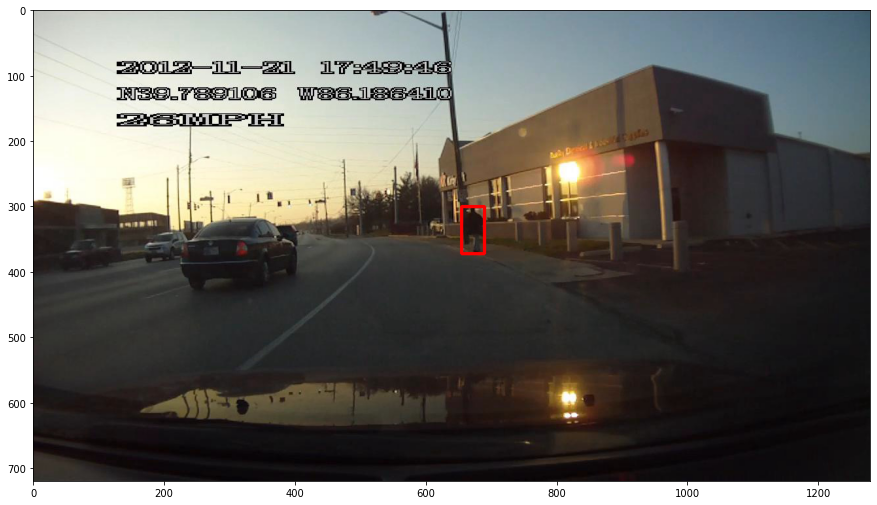

('cross', 'Man has crossed.    ', [655.25, 300.76, 690.99, 372.05])
frame 230


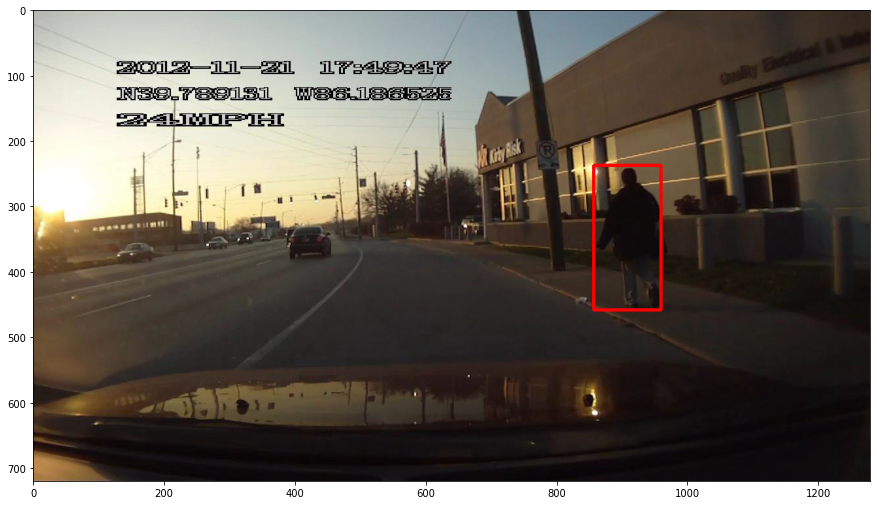

('cross', '  I thought he was attempting to cross the other way and returned.  ', [857.05, 237.84, 960.8, 458.6])


In [98]:
videoName = "video_0008"
# dbPedKey = getFirstPedKey(trainDb, videoName)
dbPedKeys = getAllPedKeys(trainDb, videoName)
frameImgs = loadVideoFrames(videoName) 
    
for dbPedKey in dbPedKeys:
    decisions = findVideoDecisions(
        trainDb[videoName][dbPedKey]['frames'], 
        trainDb[videoName][dbPedKey]['nlp_annotations'],
        trainDb[videoName][dbPedKey]['cv_annotations'])
    print(f"Pedestrian {dbPedKey}")
    printDecisions(frameImgs, decisions)

100%|████████████████████████████████████████████████████████████████████████████████| 451/451 [00:07<00:00, 63.06it/s]


frame 51


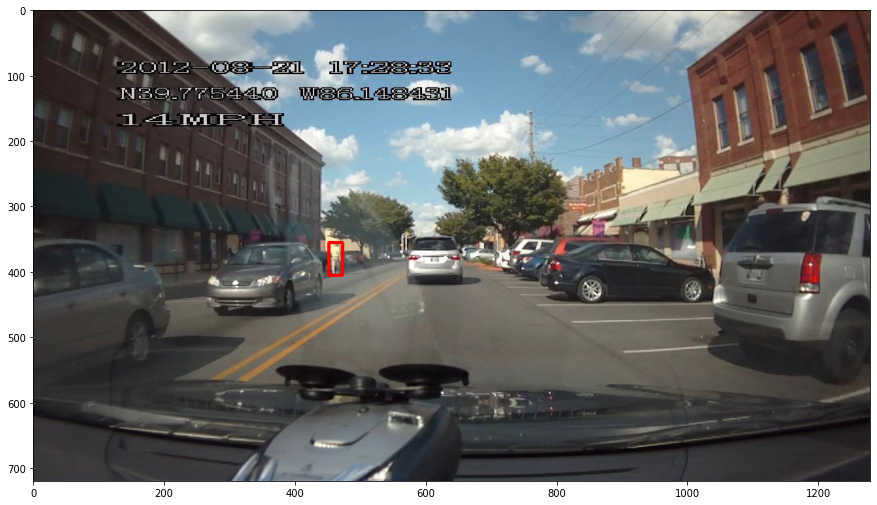

('not_cross', 'They are walking. They are faced away from the car.   They are on the far left of the road. They are to the left of the car in front. They are in front and to the left of this car.  ', [452.86, 355.09, 473.07, 405.97])
('not_cross', 'They walking slowly parallel to the traffic.  They are not facing the road. They are on the opposite side of the road where there is opposing traffic. ', [452.86, 355.09, 473.07, 405.97])
('not_sure', 'The pedestrian is walking along the road.  The car is on a city road. They are walking in the road. They are in the oncoming lane. They are ahead and to the left of the car.  ', [452.86, 355.09, 473.07, 405.97])
('not_sure', 'Person is walking normally. They are male. They are senior. Road has 2 lanes. Road is near stores. They are on road. They are in left lane. They are far from car. They are left of car. ', [452.86, 355.09, 473.07, 405.97])
('not_cross', 'Person is walking normal speed.  Person is on the left side of the road. Person is one

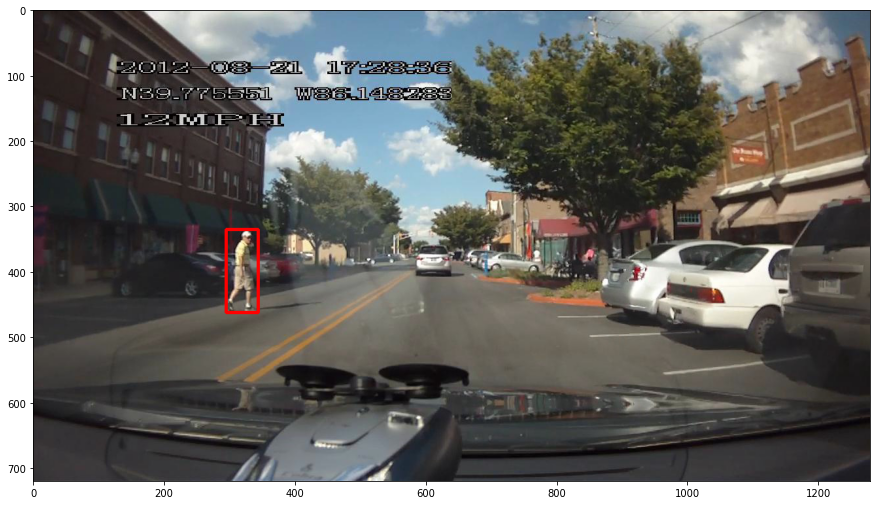

('not_cross', 'Pedestrian has turned to look at traffic. Pedestrians body language shows intent to cross. pedestrian sees car and is allowing car to pass.    pedestrians path has shifted to intersect traffic flow. Pedestrians walking path is now perpendicular to traffic.  pedestrian is very close to car.  ', [295.64, 335.91, 344.04, 462.06])
frame 177


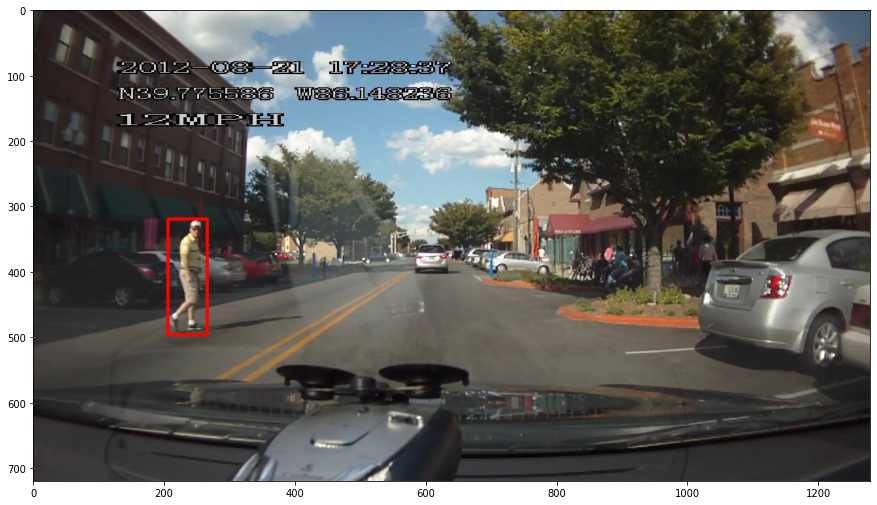

('cross', 'The pedestrian has started to cross from the left. He is looking for traffic,  They are slowly walking towards the right sidewalk. He is closely to the left of the car. ', [206.14, 319.83, 266.64, 496.84])
frame 182


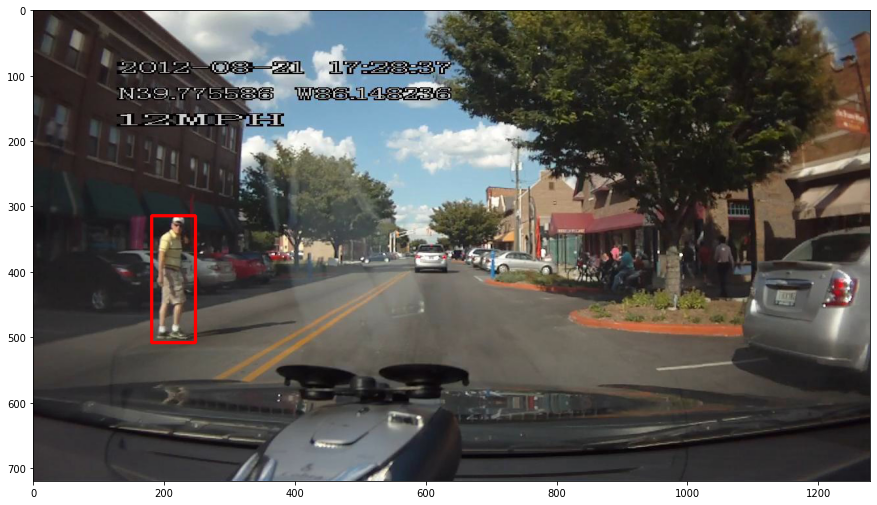

('not_cross', 'He is starting to walk toward the right side of road. The car is going to fast for the pedestrian to cross.  He is to the left of the car. ', [181.48, 314.48, 248.96, 508.44])
frame 199


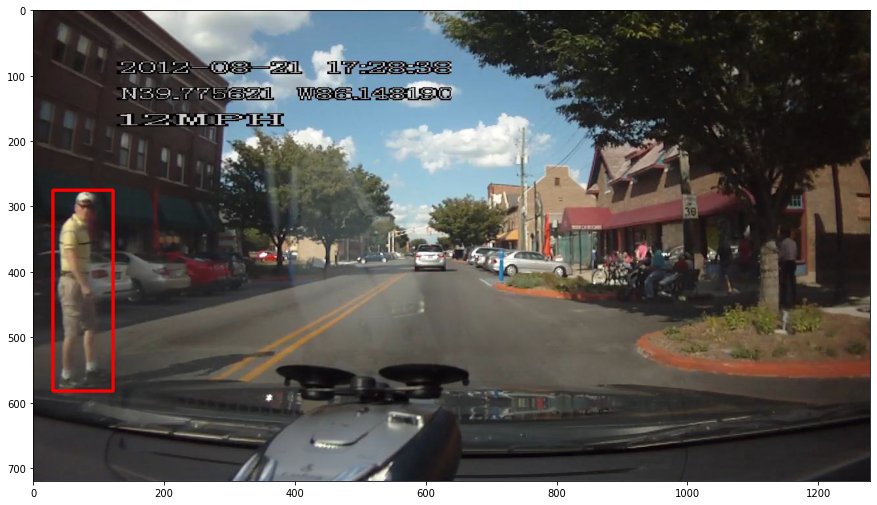

('not_cross', '   Person is near car. Person is left of car. Car did not slow down. ', [30.65, 275.97, 122.1, 582.55])
frame 171


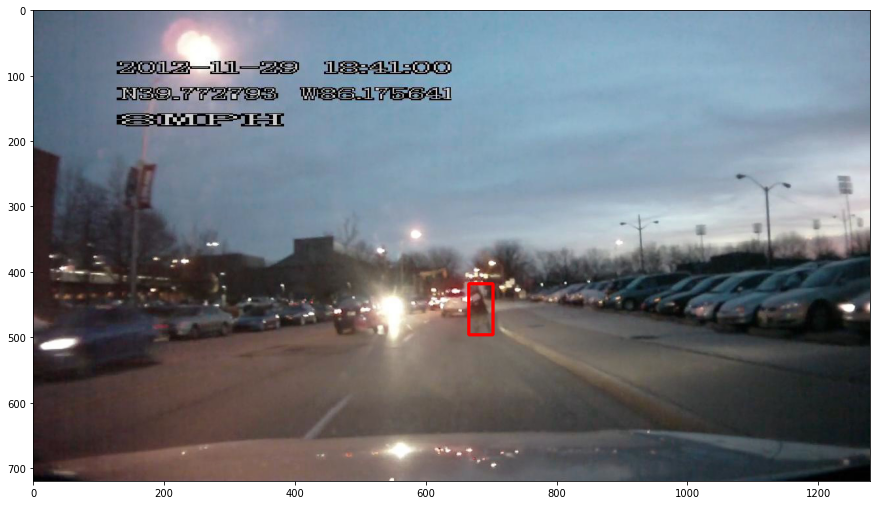

('not_cross', 'Woman is walking slowly. Campus area. Night time. Sidewalk on right. She is in the road left of sidewalk. She is in front of car to the right. Car should slow.', [666.1, 418.26, 703.58, 496.5])
('not_sure', 'The person is stopped. The driver is on a college campus. They are near a parking lot. The person is on the street. They are a couple feet from the curb. The person is in front of the driver.  ', [666.1, 418.26, 703.58, 496.5])
('cross', 'They were standing. Now, they are walking. There is parking nearby. There is no crosswalk.  They are walking towards the sidewalk. They are on the road.  They are 50 feet away. They are on the right.  Since they saw this car then started moving, they will move out of the way.', [666.1, 418.26, 703.58, 496.5])
('not_cross', 'They are frantic. They are in one spot Night time. They are in road. They are on edge of road. They are close to car. Other cars are fast. Other cars are close to them. ', [666.1, 418.26, 703.58, 496.5])
('not_cr

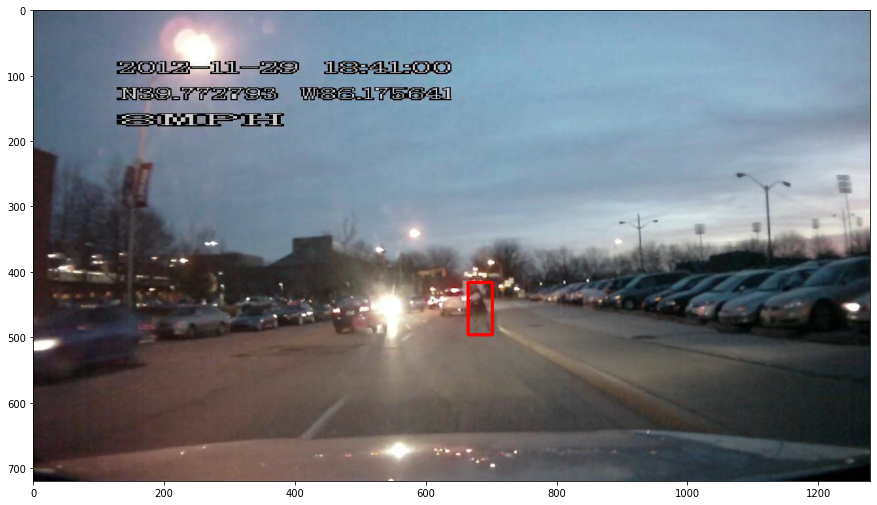

('not_sure', '    ', [665.1, 416.77, 702.96, 496.17])
frame 200


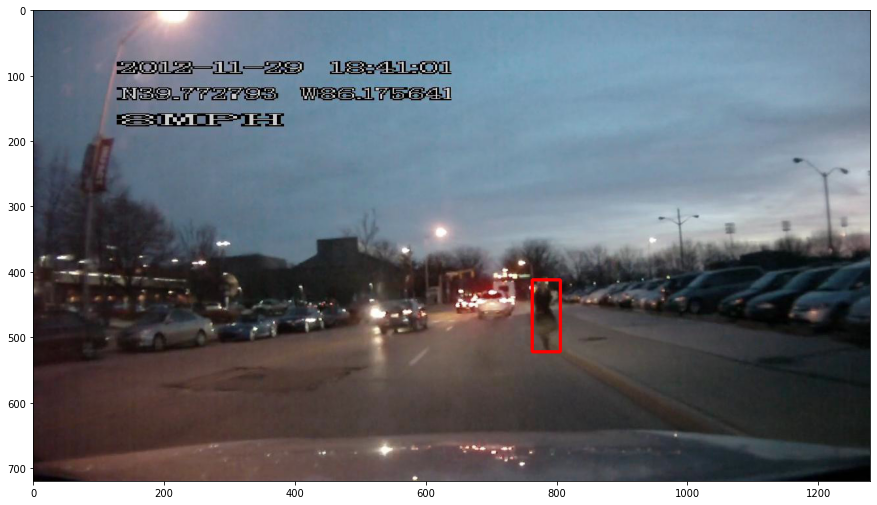

('not_cross', 'the person is walking back fast.   the person is on the right side of the road. the car is maintaining its speed. ', [763.2, 412.1, 806.0, 522.7])
frame 206


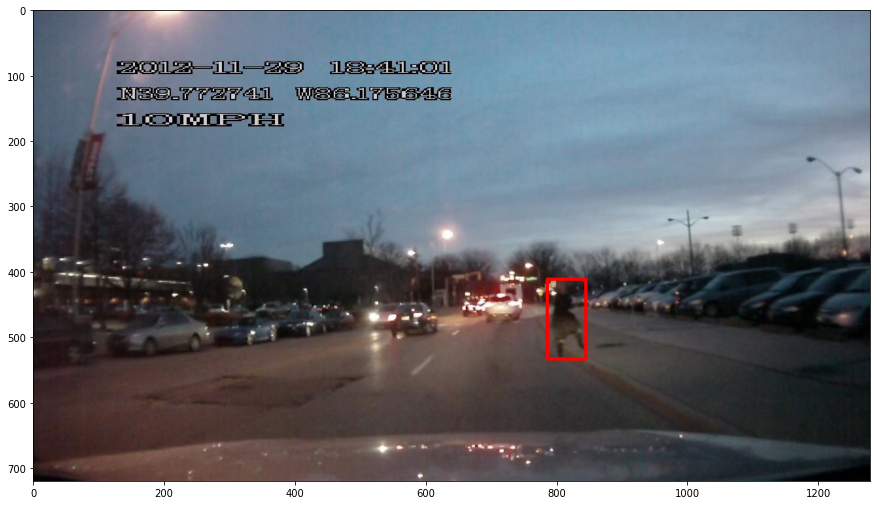

('not_cross', 'Pedestrian walks to sidewalk.  Pedestrian steps onto sidewalk.   2 lane road car side.  Traffic light.  Pedestrian is a step into the road.   Pedestrian is in slightly right of car.  Pedestrian is very close to car.   ', [786.23, 411.83, 845.7, 533.52])
frame 210


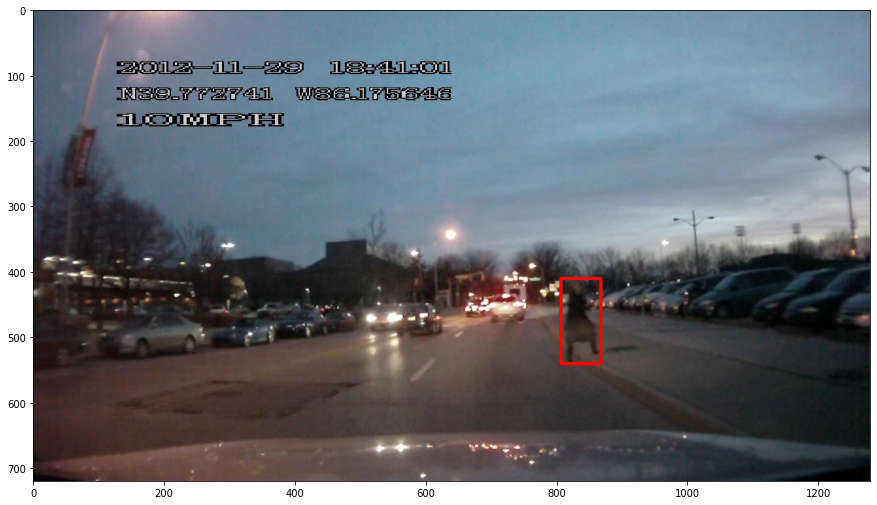

('not_cross', '  They are on the sidewalk.  Since they saw this car approaching, they moved off of the road. ', [807.55, 410.75, 868.5, 540.4])
frame 214


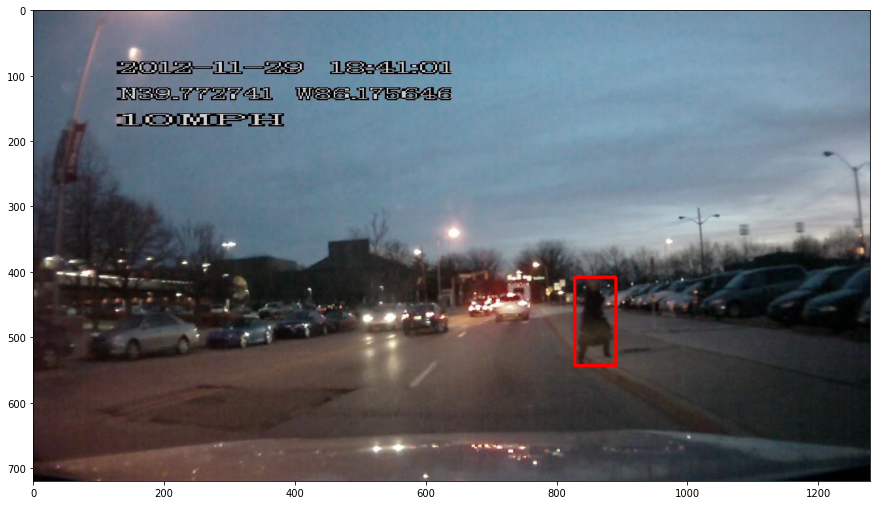

('not_cross', 'The pedestrian is getting on the sidewalk. She is getting out of the way of the car.   She is getting out of the road. She is still near the road.  She is near the car. There are other cars driving in the road.  ', [828.87, 408.71, 891.3, 543.6])
frame 217


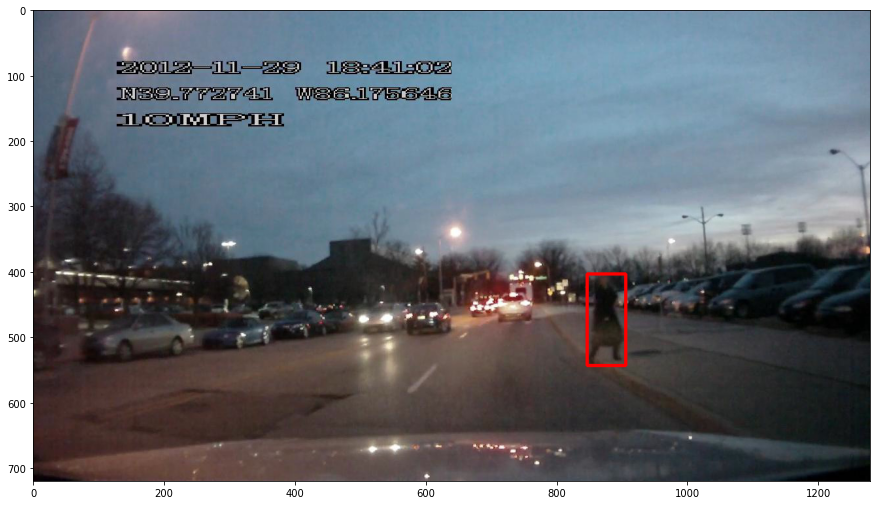

('not_cross', 'She walked back up onto the sidewalk.    ', [847.2, 403.24, 906.84, 543.48])
frame 230


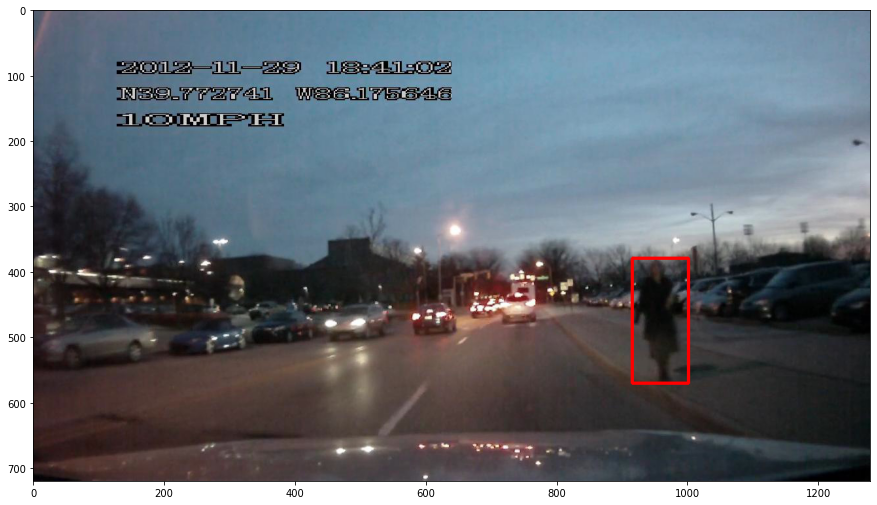

('not_cross', 'The person is walking normally.  The person is on the sidewalk. They are a couple feet from the street.  ', [916.2, 379.4, 1002.2, 570.6])
frame 94


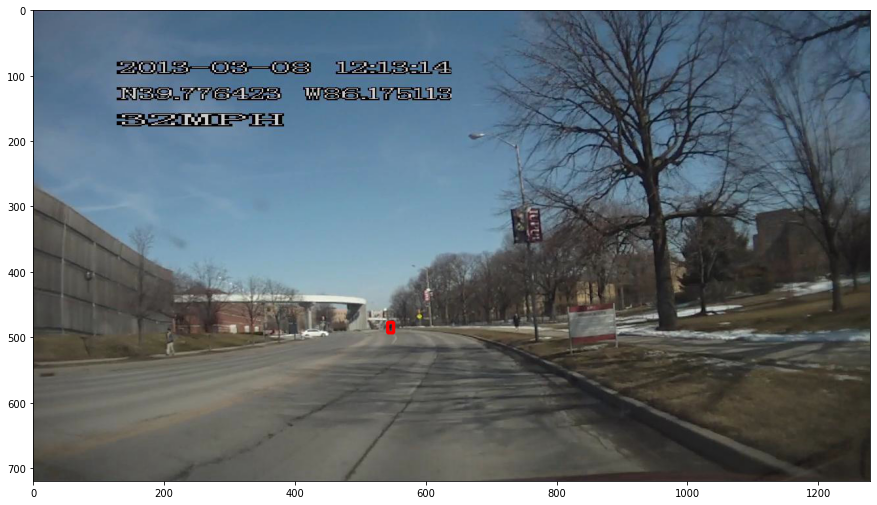

('cross', 'Pedestrian started to jog.    ', [542.17, 477.82, 551.49, 493.98])
frame 103


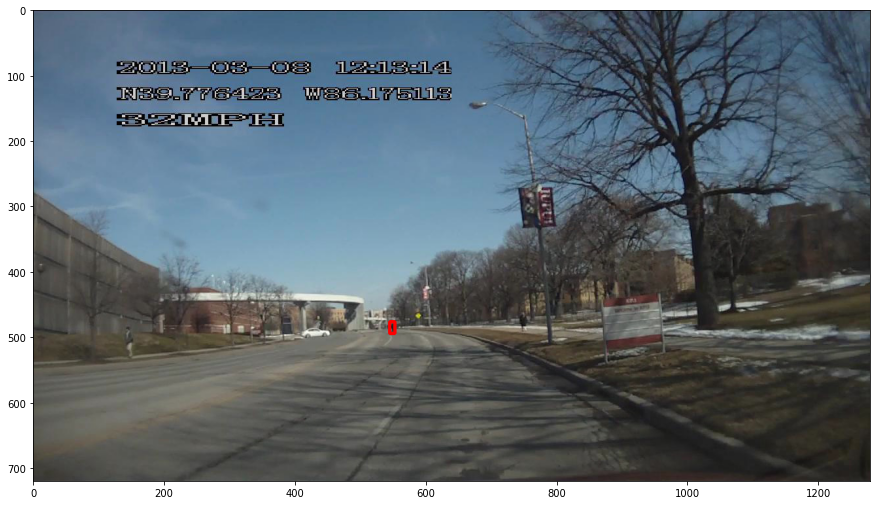

('cross', 'Pedestrian begins running.    Pedestrian is in road.  Pedestrian is crossing to sidewalk.   Pedestrian is to the left of car.   ', [545.1, 476.51, 553.78, 494.46])
frame 123


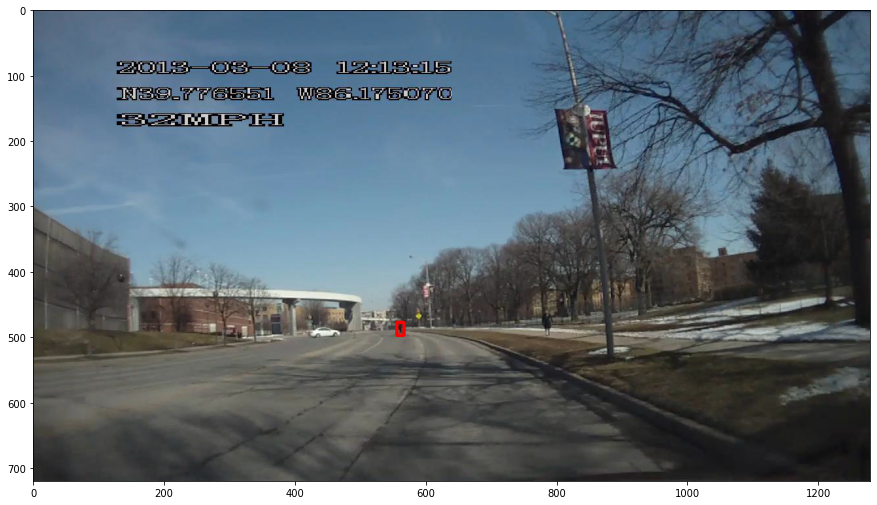

('cross', 'He started running toward my lane. He is running to the right sidewalk.  There is a pedestrian sign ahead.  He is at the left edge of my lane.  He is far from my car. My car is slowing down.  ', [556.8, 477.38, 567.07, 497.94])
frame 130


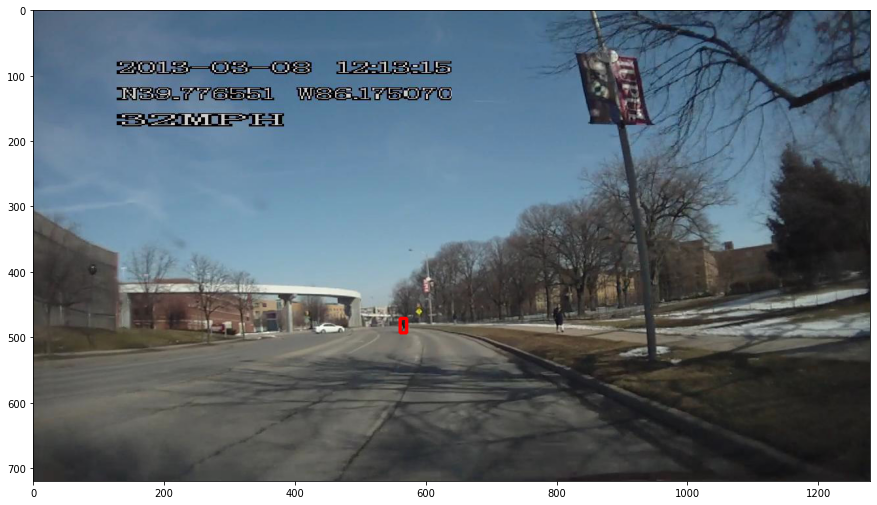

('cross', 'Pedestrian is increasing speed to a jog.   Pedestrian is in the far-right lane.  Pedestrian is still a little away from the car.  ', [561.97, 471.24, 571.68, 493.48])


In [28]:
videosToAnalyze = ['video_0002', 'video_0004', 'video_0006']

for videoName in videosToAnalyze:
    dbPedKey = getFirstPedKey(trainDb, videoName)
    decisions = findVideoDecisions(
                                trainDb[videoName][dbPedKey]['frames'], 
                                trainDb[videoName][dbPedKey]['nlp_annotations'],
                                trainDb[videoName][dbPedKey]['cv_annotations']
    )
    printDecisions(loadVideoFrames(videoName), decisions)